# Stellar ejection velocity comparison

Notebook to accompany *Wagg et al. 2025* research note on stellar ejection velocities in population synthesis.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
import seaborn as sns
import pandas as pd
import h5py as h5
from scipy.stats import maxwell

In [2]:
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': 0.7 * fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.7 * fs,
          'ytick.labelsize': 0.7 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4,
          'legend.fontsize': fs,
}
plt.rcParams.update(params)

# show all pandas columns
pd.set_option('display.max_columns', None)

<hr>

# Read data

## `COSMIC`

In [62]:
bpp, cosmic_kicks = pd.read_hdf("data/cosmic.h5", key="bpp"), pd.read_hdf("data/cosmic.h5", key="kick_info")
cosmic_kicks.drop_duplicates(subset="bin_num", keep="first", inplace=True)

In [64]:
sn_1_row = bpp[bpp["evol_type"] == 15].iloc[0]

v_orb = (2 * np.pi * sn_1_row["sep"] * u.Rsun / sn_1_row["porb"] / u.day).to(u.km / u.s)
cosmic_v_orb_2 = sn_1_row["mass_1"] / (sn_1_row["mass_1"] + sn_1_row["mass_2"]) * v_orb
vsys_2_total = cosmic_kicks[cosmic_kicks["star"] == 1]["vsys_2_total"]

final_bpp = bpp.drop_duplicates(subset="bin_num", keep="last")

cosmic_m1_prev, cosmic_m2_prev = sn_1_row[["mass_1", "mass_2"]].values
cosmic_m1_post = final_bpp[final_bpp["sep"] == -1].iloc[0]["mass_1"]

## `COMPAS`

In [72]:
df_dict = {}

with h5.File(f"data/compas/COMPAS_Output.h5") as f:
    for k in f["BSE_Supernovae"].keys():
        df_dict[k] = f["BSE_Supernovae"][k][...]
df = pd.DataFrame(df_dict).set_index("SEED", drop=False)
df = df.drop_duplicates(subset="SEED", keep="first")

print(f'Disruption rate: {100 - ((df["Unbound"] == 0).sum() / len(df) * 100)}%')

compas_v_orb_2 = (df["Orb_Velocity<SN"] * (df["Mass_Total@CO(SN)"] / (df["Mass(CP)"] + df["Mass_Total@CO(SN)"]))).iloc[0] * u.km / u.s
compas_m1_prev = df["Mass_Total@CO(SN)"].iloc[0]
compas_m2_prev = df["Mass(CP)"].iloc[0]
compas_m1_post = df["Mass(SN)"].iloc[0]

print(f"v_orb_2 = {compas_v_orb_2}")

compas_kicks = df.rename(columns={"ComponentSpeed(CP)": "vsys_2_total",
                                 "Applied_Kick_Magnitude(SN)": "natal_kick",
                                 "Unbound": "disrupted",
                                 "SN_Kick_Theta(SN)": "phi",
                                 "SN_Kick_Phi(SN)": "theta"})
compas_kicks["theta"] = compas_kicks["theta"].apply(lambda x: np.degrees(x))
compas_kicks["phi"] = compas_kicks["phi"].apply(lambda x: np.degrees(x))

Disruption rate: 99.104%
v_orb_2 = 14.632644587924512 km / s


## `binary_c`

In [92]:
bc_kicks = pd.read_csv("data/binary_c/first.dat", header=0, sep="\s+")

bc_kicks.rename(columns={"v_other_tt": "vsys_2_total", "sn_kick_speed": "natal_kick",
                         "sn_kick_omega": "theta", "sn_kick_phi": "phi"}, inplace=True)
bc_kicks["theta"] = bc_kicks["theta"].apply(lambda x: np.degrees(x))
bc_kicks["phi"] = bc_kicks["phi"].apply(lambda x: np.degrees(x))

bc_kicks["disrupted"] = ((bc_kicks["separation"] < 0.0) | (bc_kicks["vsys_2_total"] == 0.0)).astype(int)

bc_m1_prev = bc_kicks["pre_sn_mass_1"].iloc[0]
bc_m2_prev = bc_kicks["pre_sn_mass_2"].iloc[0]
bc_m1_post = bc_kicks["mass"].iloc[0]

bc_v_orb = (2 * np.pi * bc_kicks["pre_sn_separation"].values * u.Rsun / bc_kicks["pre_sn_period"].values / u.yr).to(u.km / u.s)
bc_v_orb_2 = ((bc_kicks["pre_sn_mass_1"] / (bc_kicks["pre_sn_mass_1"] + bc_kicks["pre_sn_mass_2"])).iloc[0] * bc_v_orb[0])

## All together now!

In [94]:
data = [
    {"kicks": cosmic_kicks, "v_orb_2": cosmic_v_orb_2, "l": "COSMIC", "c": "tab:blue",
     "m1_prev": cosmic_m1_prev, "m2_prev": cosmic_m2_prev, "m1_post": cosmic_m1_post},
    {"kicks": compas_kicks, "v_orb_2": compas_v_orb_2, "l": "COMPAS", "c": "tab:orange",
     "m1_prev": compas_m1_prev, "m2_prev": compas_m2_prev, "m1_post": compas_m1_post},
    {"kicks": bc_kicks, "v_orb_2": bc_v_orb_2, "l": "binary_c", "c": "tab:green",
     "m1_prev": bc_m1_prev, "m2_prev": bc_m2_prev, "m1_post": bc_m1_post}
]

<hr>

# Basic histograms

First, we can separately plot the natal kick distributions (to ensure they are identical) and consider how the ejection velocity distributions compare.

## Natal kick

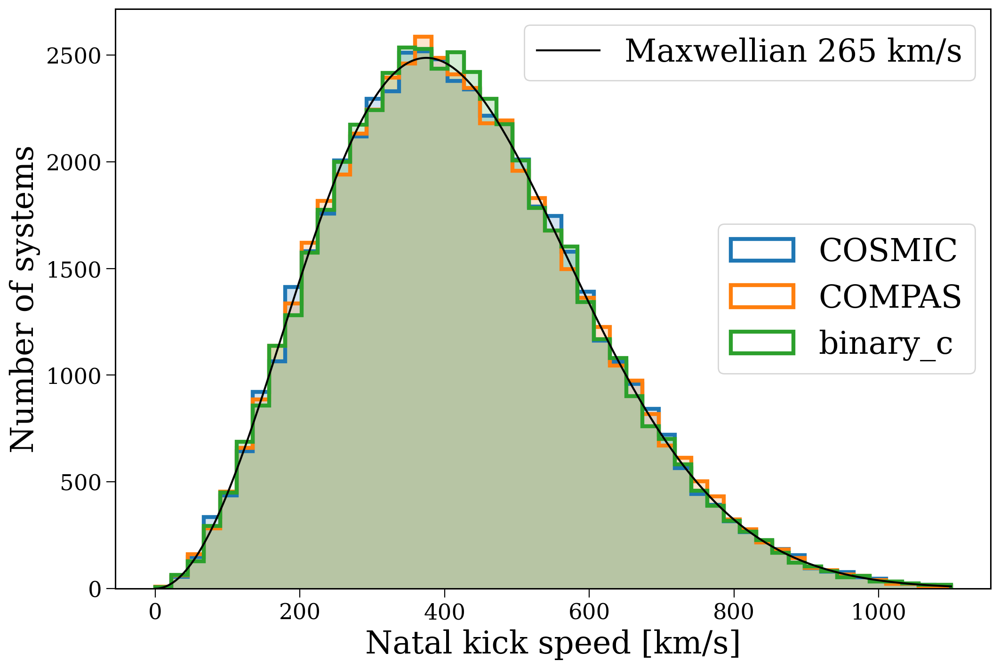

In [154]:
fig, ax = plt.subplots()

bins = np.linspace(0, 1100, 50)
v_range = np.linspace(0, 1100, 1000)

for d in data:
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), histtype="step",
            lw=3, color=d["c"], label=d['l']);
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), color=d['c'], alpha=0.2);

leg = ax.legend(loc="center right")

ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=265) * bins[1], color="black", label="Maxwellian 265 km/s")
# ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=215) * bins[1], color="black", linestyle="--", label="Maxwellian 215 km/s")

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[-1:], labels[-1:], loc="upper right")
ax.add_artist(leg)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Number of systems")

plt.show()

## Ejection velocity

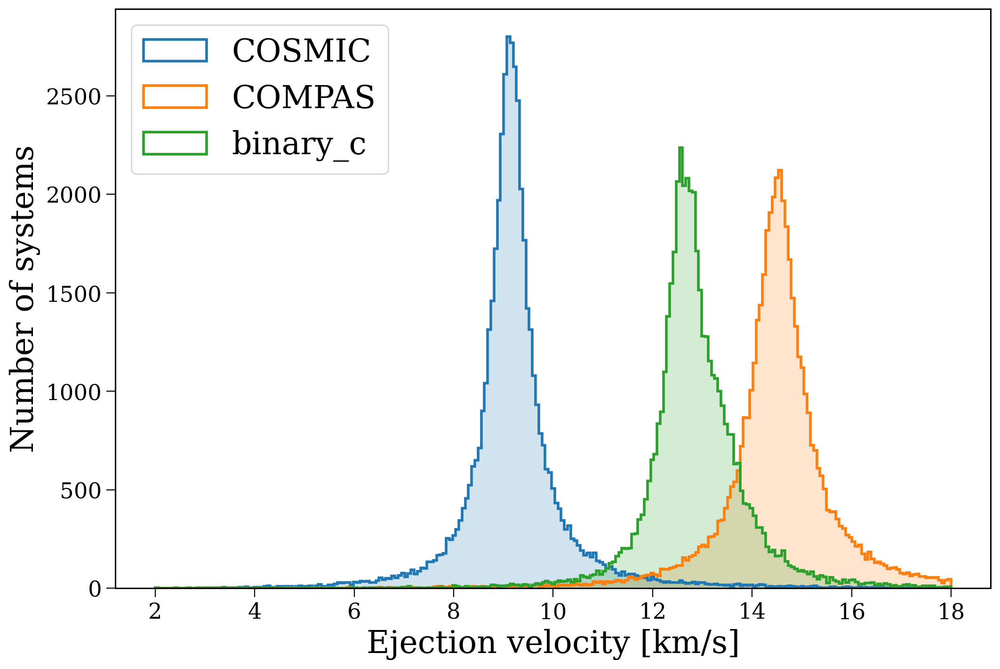

In [28]:
fig, ax = plt.subplots()

bins = np.linspace(2, 18, 250)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    ax.hist(kicks["vsys_2_total"], bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(kicks["vsys_2_total"], bins=bins, color=d['c'], alpha=0.2);

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-3.0640282 -0.1284882  3.7995668]


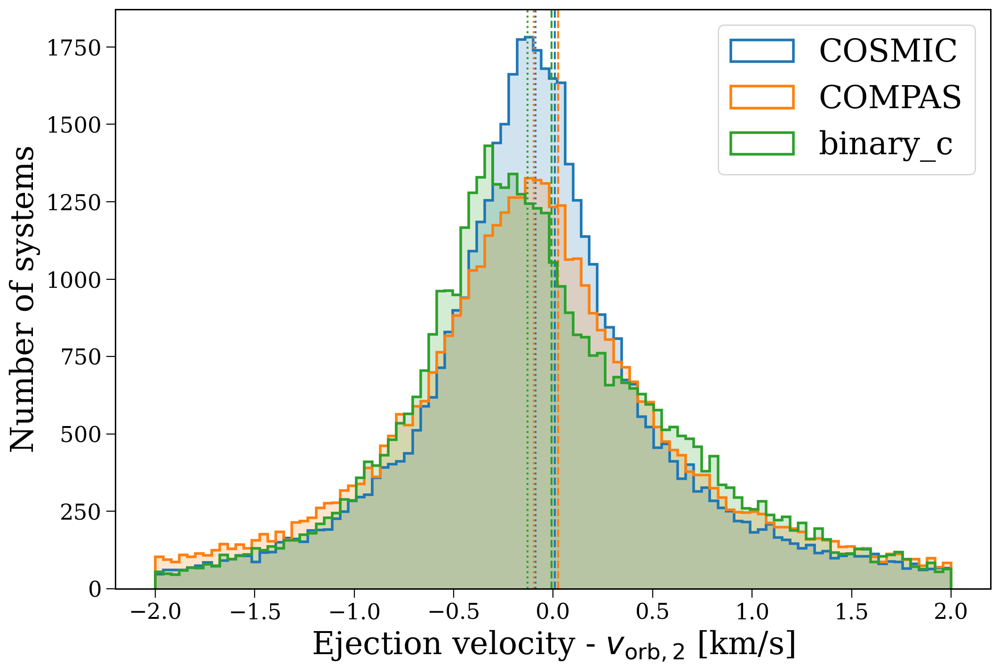

In [22]:
fig, ax = plt.subplots()

bins = np.linspace(-2, 2, 100)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2);
    ax.axvline(np.mean(diff), color=d["c"], linestyle="--")
    ax.axvline(np.median(diff), color=d["c"], linestyle="dotted")

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity - $v_{\\rm orb,2}$ [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-5.48052388 -0.12753388  5.04107612]


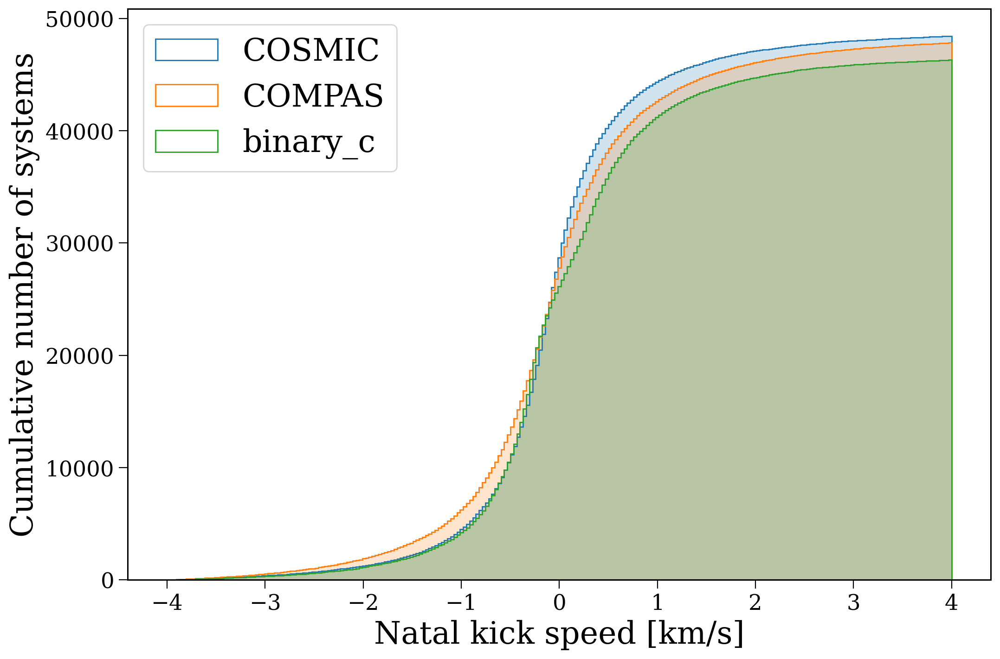

In [47]:
fig, ax = plt.subplots()

bins = np.linspace(-4, 4, 250)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=1, color=d["c"], label=d['l'], cumulative=True);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2, cumulative=True);

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Cumulative number of systems")

plt.show()

# 2D density distributions

In [124]:
np.linspace(0.05, 1, 6)

array([0.05, 0.24, 0.43, 0.62, 0.81, 1.  ])

In [125]:
import operator
import math

from matplotlib.colors import to_rgba
import matplotlib
import numpy as np

"""This file is copied from Seaborn source to reproduce cmaps"""


def cmap_from_colour(colour):
    r, g, b, _ = to_rgba(colour)
    h, s, _ = rgb_to_husl(r, g, b)
    xx = np.linspace(-1, 1, int(1.15 * 256))[:256]
    ramp = np.zeros((256, 3))
    ramp[:, 0] = h
    ramp[:, 1] = s * np.cos(xx)
    ramp[:, 2] = np.linspace(35, 80, 256)
    colors = np.clip([husl_to_rgb(*hsl) for hsl in ramp], 0, 1)
    return matplotlib.colors.ListedColormap(colors[::-1])


m = [
    [3.2406, -1.5372, -0.4986],
    [-0.9689, 1.8758, 0.0415],
    [0.0557, -0.2040, 1.0570]
]

m_inv = [
    [0.4124, 0.3576, 0.1805],
    [0.2126, 0.7152, 0.0722],
    [0.0193, 0.1192, 0.9505]
]

# Hard-coded D65 illuminant
refX = 0.95047
refY = 1.00000
refZ = 1.08883
refU = 0.19784
refV = 0.46834
lab_e = 0.008856
lab_k = 903.3


# Public API

def husl_to_rgb(h, s, l):
    return lch_to_rgb(*husl_to_lch([h, s, l]))


def husl_to_hex(h, s, l):
    return rgb_to_hex(husl_to_rgb(h, s, l))


def rgb_to_husl(r, g, b):
    return lch_to_husl(rgb_to_lch(r, g, b))


def hex_to_husl(hex):
    return rgb_to_husl(*hex_to_rgb(hex))


def huslp_to_rgb(h, s, l):
    return lch_to_rgb(*huslp_to_lch([h, s, l]))


def huslp_to_hex(h, s, l):
    return rgb_to_hex(huslp_to_rgb(h, s, l))


def rgb_to_huslp(r, g, b):
    return lch_to_huslp(rgb_to_lch(r, g, b))


def hex_to_huslp(hex):
    return rgb_to_huslp(*hex_to_rgb(hex))


def lch_to_rgb(l, c, h):
    return xyz_to_rgb(luv_to_xyz(lch_to_luv([l, c, h])))


def rgb_to_lch(r, g, b):
    return luv_to_lch(xyz_to_luv(rgb_to_xyz([r, g, b])))


def max_chroma(L, H):
    hrad = math.radians(H)
    sinH = (math.sin(hrad))
    cosH = (math.cos(hrad))
    sub1 = (math.pow(L + 16, 3.0) / 1560896.0)
    sub2 = sub1 if sub1 > 0.008856 else (L / 903.3)
    result = float("inf")
    for row in m:
        m1 = row[0]
        m2 = row[1]
        m3 = row[2]
        top = ((0.99915 * m1 + 1.05122 * m2 + 1.14460 * m3) * sub2)
        rbottom = (0.86330 * m3 - 0.17266 * m2)
        lbottom = (0.12949 * m3 - 0.38848 * m1)
        bottom = (rbottom * sinH + lbottom * cosH) * sub2

        for t in (0.0, 1.0):
            C = (L * (top - 1.05122 * t) / (bottom + 0.17266 * sinH * t))
            if C > 0.0 and C < result:
                result = C
    return result


def _hrad_extremum(L):
    lhs = (math.pow(L, 3.0) + 48.0 * math.pow(L, 2.0) + 768.0 * L + 4096.0) / 1560896.0
    rhs = 1107.0 / 125000.0
    sub = lhs if lhs > rhs else 10.0 * L / 9033.0
    chroma = float("inf")
    result = None
    for row in m:
        for limit in (0.0, 1.0):
            [m1, m2, m3] = row
            top = -3015466475.0 * m3 * sub + 603093295.0 * m2 * sub - 603093295.0 * limit
            bottom = 1356959916.0 * m1 * sub - 452319972.0 * m3 * sub
            hrad = math.atan2(top, bottom)
            # This is a math hack to deal with tan quadrants, I'm too lazy to figure
            # out how to do this properly
            if limit == 0.0:
                hrad += math.pi
            test = max_chroma(L, math.degrees(hrad))
            if test < chroma:
                chroma = test
                result = hrad
    return result


def max_chroma_pastel(L):
    H = math.degrees(_hrad_extremum(L))
    return max_chroma(L, H)


def dot_product(a, b):
    return sum(map(operator.mul, a, b))


def f(t):
    if t > lab_e:
        return (math.pow(t, 1.0 / 3.0))
    else:
        return (7.787 * t + 16.0 / 116.0)


def f_inv(t):
    if math.pow(t, 3.0) > lab_e:
        return (math.pow(t, 3.0))
    else:
        return (116.0 * t - 16.0) / lab_k


def from_linear(c):
    if c <= 0.0031308:
        return 12.92 * c
    else:
        return (1.055 * math.pow(c, 1.0 / 2.4) - 0.055)


def to_linear(c):
    a = 0.055

    if c > 0.04045:
        return (math.pow((c + a) / (1.0 + a), 2.4))
    else:
        return (c / 12.92)


def rgb_prepare(triple):
    ret = []
    for ch in triple:
        ch = round(ch, 3)

        if ch < -0.0001 or ch > 1.0001:
            raise Exception("Illegal RGB value %f" % ch)

        if ch < 0:
            ch = 0
        if ch > 1:
            ch = 1

        # Fix for Python 3 which by default rounds 4.5 down to 4.0
        # instead of Python 2 which is rounded to 5.0 which caused
        # a couple off by one errors in the tests. Tests now all pass
        # in Python 2 and Python 3
        ret.append(int(round(ch * 255 + 0.001, 0)))

    return ret


def hex_to_rgb(hex):
    if hex.startswith('#'):
        hex = hex[1:]
    r = int(hex[0:2], 16) / 255.0
    g = int(hex[2:4], 16) / 255.0
    b = int(hex[4:6], 16) / 255.0
    return [r, g, b]


def rgb_to_hex(triple):
    [r, g, b] = triple
    return '#%02x%02x%02x' % tuple(rgb_prepare([r, g, b]))


def xyz_to_rgb(triple):
    xyz = map(lambda row: dot_product(row, triple), m)
    return list(map(from_linear, xyz))


def rgb_to_xyz(triple):
    rgbl = list(map(to_linear, triple))
    return list(map(lambda row: dot_product(row, rgbl), m_inv))


def xyz_to_luv(triple):
    X, Y, Z = triple

    if X == Y == Z == 0.0:
        return [0.0, 0.0, 0.0]

    varU = (4.0 * X) / (X + (15.0 * Y) + (3.0 * Z))
    varV = (9.0 * Y) / (X + (15.0 * Y) + (3.0 * Z))
    L = 116.0 * f(Y / refY) - 16.0

    # Black will create a divide-by-zero error
    if L == 0.0:
        return [0.0, 0.0, 0.0]

    U = 13.0 * L * (varU - refU)
    V = 13.0 * L * (varV - refV)

    return [L, U, V]


def luv_to_xyz(triple):
    L, U, V = triple

    if L == 0:
        return [0.0, 0.0, 0.0]

    varY = f_inv((L + 16.0) / 116.0)
    varU = U / (13.0 * L) + refU
    varV = V / (13.0 * L) + refV
    Y = varY * refY
    X = 0.0 - (9.0 * Y * varU) / ((varU - 4.0) * varV - varU * varV)
    Z = (9.0 * Y - (15.0 * varV * Y) - (varV * X)) / (3.0 * varV)

    return [X, Y, Z]


def luv_to_lch(triple):
    L, U, V = triple

    C = (math.pow(math.pow(U, 2) + math.pow(V, 2), (1.0 / 2.0)))
    hrad = (math.atan2(V, U))
    H = math.degrees(hrad)
    if H < 0.0:
        H = 360.0 + H

    return [L, C, H]


def lch_to_luv(triple):
    L, C, H = triple

    Hrad = math.radians(H)
    U = (math.cos(Hrad) * C)
    V = (math.sin(Hrad) * C)

    return [L, U, V]


def husl_to_lch(triple):
    H, S, L = triple

    if L > 99.9999999:
        return [100, 0.0, H]
    if L < 0.00000001:
        return [0.0, 0.0, H]

    mx = max_chroma(L, H)
    C = mx / 100.0 * S

    return [L, C, H]


def lch_to_husl(triple):
    L, C, H = triple

    if L > 99.9999999:
        return [H, 0.0, 100.0]
    if L < 0.00000001:
        return [H, 0.0, 0.0]

    mx = max_chroma(L, H)
    S = C / mx * 100.0

    return [H, S, L]


def huslp_to_lch(triple):
    H, S, L = triple

    if L > 99.9999999:
        return [100, 0.0, H]
    if L < 0.00000001:
        return [0.0, 0.0, H]

    mx = max_chroma_pastel(L)
    C = mx / 100.0 * S

    return [L, C, H]


def lch_to_huslp(triple):
    L, C, H = triple

    if L > 99.9999999:
        return [H, 0.0, 100.0]
    if L < 0.00000001:
        return [H, 0.0, 0.0]

    mx = max_chroma_pastel(L)
    S = C / mx * 100.0

    return [H, S, L]

In [155]:
def plot_kick_density(d, label="COSMIC", every=1, lim=4.5, CORNER_ANNOTATE=False, save=None,
                      gridsize=500, **kwargs):
    """Plot 2D density distribution for each different population synthesis code"""

    levels = [0.05, 0.25, 0.5, 0.75, 0.9, 1.0]
    level_labels = ["95%", "75%", "50%", "25%", "10%", "0%"]

    natal_kicks, v_orb_2 = d["kicks"], d["v_orb_2"]

    fig, axes = plt.subplots(2, 2, figsize=(12, 12), gridspec_kw={"width_ratios": [4, 1], "height_ratios": [1, 4]}, sharex="col", sharey="row")
    fig.subplots_adjust(hspace=0.03, wspace=0.03)

    # difference between ejection velocities and preSN orbital velocity
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)
    diff = natal_kicks["vsys_2_total"][mask] - v_orb_2

    # add difference histogram within chosen limits (and remove white lines with patches)
    patches = axes[0, 0].hist(diff[abs(diff) < lim], bins=np.linspace(-lim, lim, 150), **kwargs)[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    # same for the natal kick magnitude
    patches = axes[1, 1].hist(natal_kicks["natal_kick"],
                              bins=np.linspace(0, 1100, 50),
                              orientation="horizontal", **kwargs)[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    axes[1, 0].scatter(np.mean(diff),
                       np.mean(natal_kicks["natal_kick"][mask]), marker="x", s=50, color="black", zorder=10)
    # same for median
    axes[1, 0].scatter(np.median(diff),
                       np.median(natal_kicks["natal_kick"][mask]), marker="+", s=100, color="black", zorder=10)

    sns.kdeplot(x=diff[::every],
                y=natal_kicks["natal_kick"][mask][::every],
                ax=axes[1, 0], fill=True, levels=levels,
                gridsize=gridsize,
                **kwargs)

    axes[1, 0].set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
                   ylabel="Natal kick velocity (km/s)",
                   xlim=(-lim, lim),
                   ylim=(0, 1100))

    # annotate system details in corner or on main panel
    if CORNER_ANNOTATE:
        axes[0, 1].annotate(label, (0.5, 0.8), xycoords="axes fraction", color="black", fontsize=fs, ha="center", va="center")
        axes[0, 1].annotate(
            r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.1f} km/s\n' +
            r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks):1.3f}\n' +
            r"$m_{\rm 1, preSN} = $" + f'{sn_1_row["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{bpp.iloc[-1]["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 2} = $" + f'{sn_1_row["mass_2"]:1.2f} $\\rm M_{{\odot}}$',
            (0.5, 0.35), xycoords="axes fraction", fontsize=0.6*fs, ha="center", va="center"
        )
    else:
        axes[1, 0].annotate(label, (0.05, 0.95), xycoords="axes fraction", color="black",
                            fontsize=1.3*fs, fontweight="normal", ha="left", va="top")
        axes[1, 0].annotate(
            " " * 2 + r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.1f} km/s\n' +
            " " * 4 + r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks) * 100:1.0f}%\n' +
            " " * 1 + r"$m_{\rm 1, preSN} = $" + f'{d["m1_prev"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{d["m1_post"]:1.2f} $\\rm M_{{\odot}}$\n' +
            " " * 9 + r"$m_{\rm 2} = $" + f'{d["m2_prev"]:1.2f} $\\rm M_{{\odot}}$',
            (0.64, 0.98), xycoords="axes fraction", fontsize=0.7*fs, ha="left", va="top"
        )

    # add a line at zero and hide the mini ax
    axes[1, 0].axvline(0, color="black", linestyle="dotted", lw=1)
    axes[0, 1].axis("off")

    # the lazy man's guide to colorbars: just plot hidden points
    cmap = cmap_from_colour(d["c"])
    scatter = axes[1, 0].scatter(np.ones_like(levels) * 1e5, np.ones_like(levels) * 1e-21, c=levels, cmap=cmap)
    inset_all_ax = axes[1, 0].inset_axes([0.03, 0.5, 0.08, 0.35])
    cbar = fig.colorbar(scatter, ax=axes[1, 0], cax=inset_all_ax, boundaries=levels)
    # cbar.ax.invert_yaxis()
    cbar.set_ticklabels(level_labels)
    cbar.ax.tick_params(labelsize=fs)

    if save is not None:
        plt.savefig(f"paper/figures/{save}.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()

In [163]:
data = [
    {"kicks": cosmic_kicks, "v_orb_2": cosmic_v_orb_2, "l": "COSMIC", "c": "rebeccapurple",
     "m1_prev": cosmic_m1_prev, "m2_prev": cosmic_m2_prev, "m1_post": cosmic_m1_post},
    {"kicks": compas_kicks, "v_orb_2": compas_v_orb_2, "l": "COMPAS", "c": "steelblue",
     "m1_prev": compas_m1_prev, "m2_prev": compas_m2_prev, "m1_post": compas_m1_post},
    {"kicks": bc_kicks, "v_orb_2": bc_v_orb_2, "l": "binary_c", "c": "teal",
     "m1_prev": bc_m1_prev, "m2_prev": bc_m2_prev, "m1_post": bc_m1_post}
]

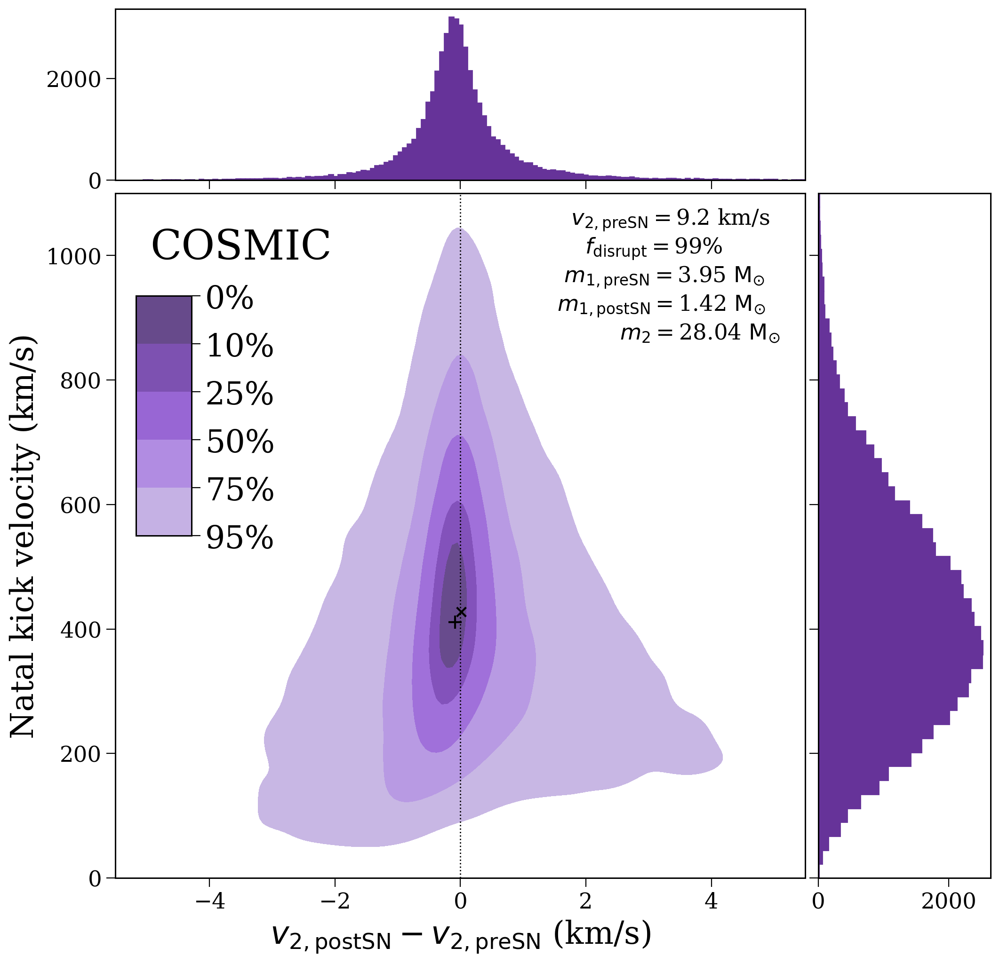

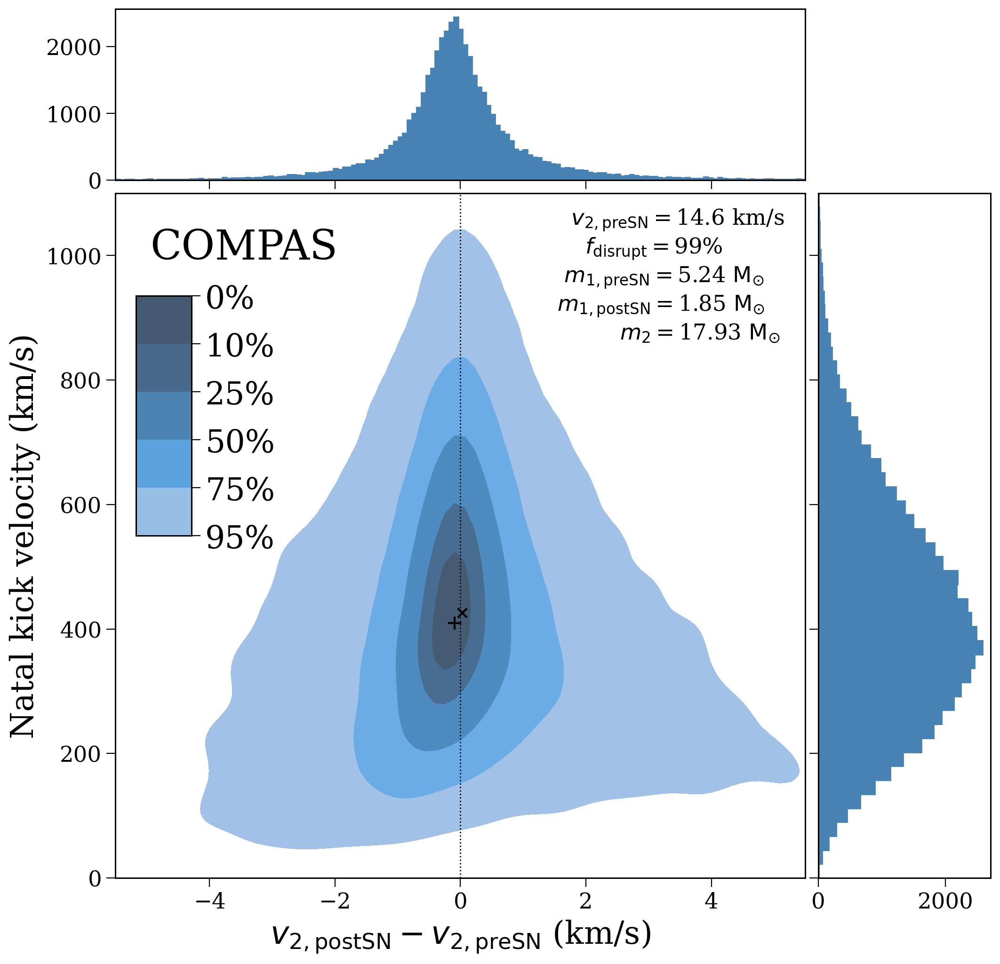

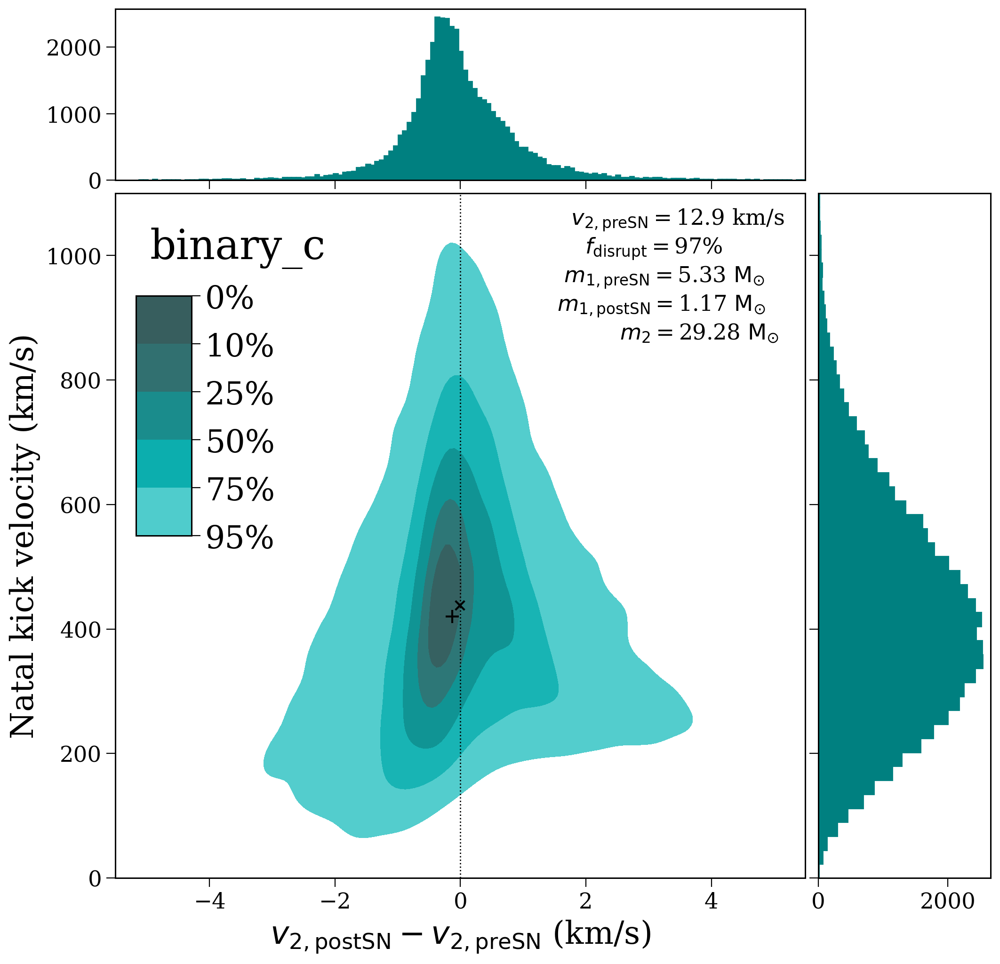

In [165]:
for d in data:
    plot_kick_density(d, label=d["l"], save=d["l"].lower(),
                      every=1, color=d["c"], lim=5.5, gridsize=500)

# `binary_c` has correlated kicks and angles?

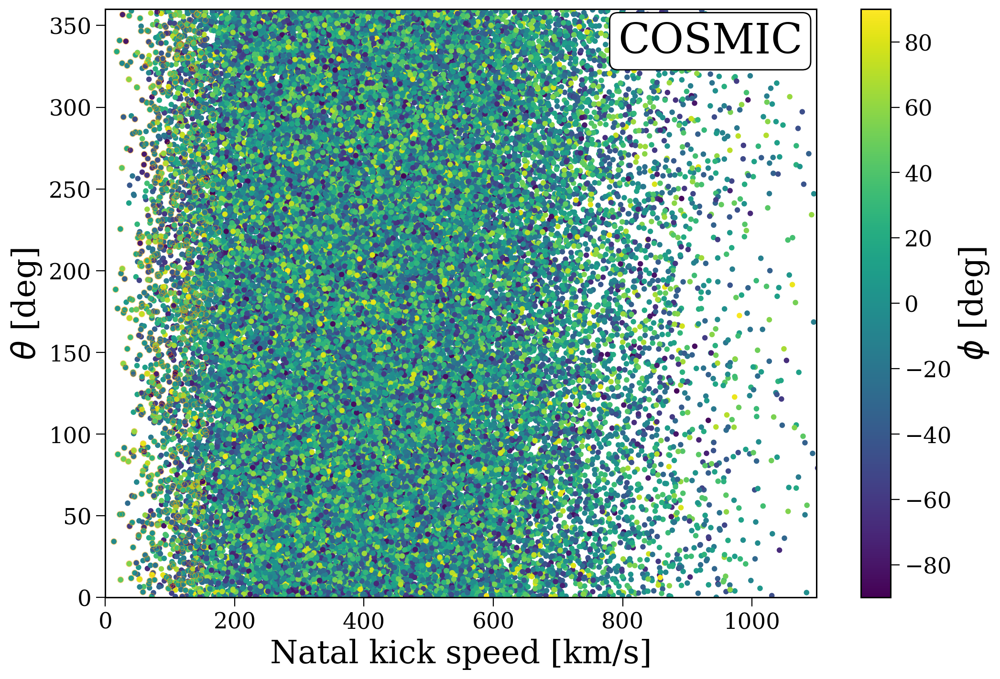

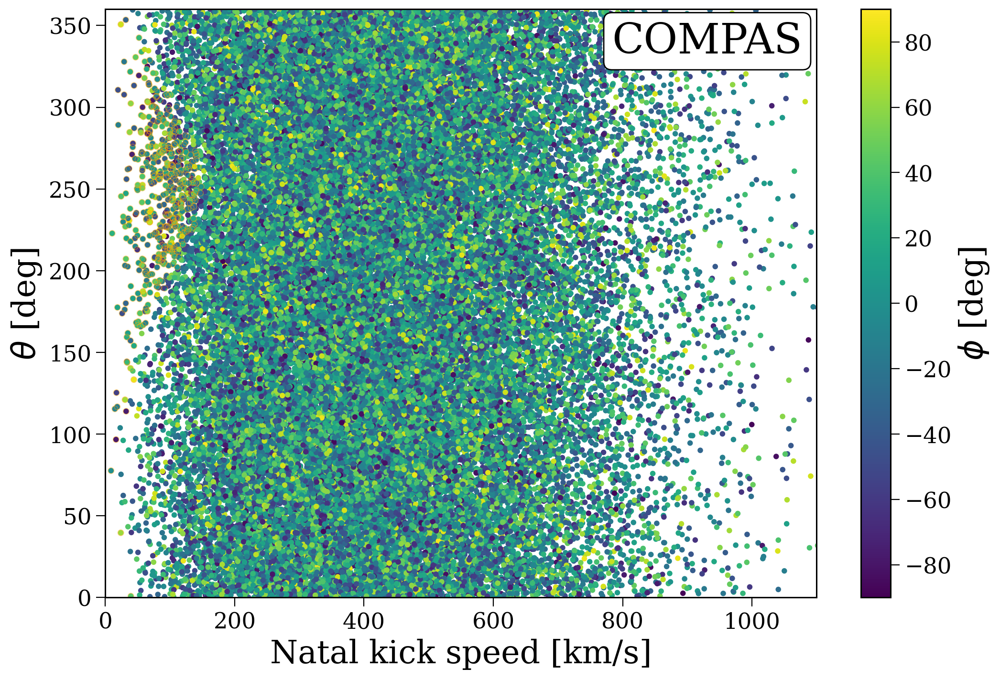

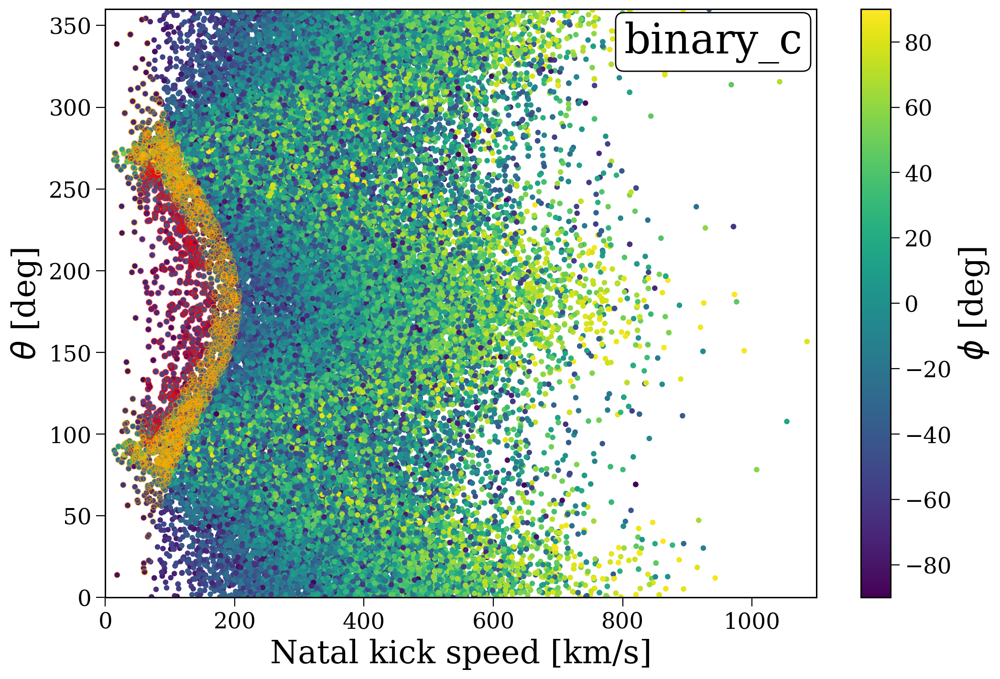

In [13]:
for d in data:
    scatter = plt.scatter(d["kicks"]["natal_kick"], d["kicks"]["theta"], s=10, c=d["kicks"]["phi"], vmin=-90, vmax=90, cmap="viridis")

    mask = (d["kicks"]["vsys_2_total"] == 0) & (d["kicks"]["disrupted"] == 1)
    plt.scatter(d["kicks"]["natal_kick"][mask], d["kicks"]["theta"][mask], s=20, marker="o",
                facecolor="none", edgecolor="red", lw=0.5, alpha=0.5)
    mask = (d["kicks"]["disrupted"] == 0)
    plt.scatter(d["kicks"]["natal_kick"][mask], d["kicks"]["theta"][mask], s=20, marker="o",
                facecolor="none", edgecolor="orange", lw=0.5, alpha=0.5)
    cbar = plt.colorbar(scatter, label=r"$\phi$ [deg]")
    plt.xlabel("Natal kick speed [km/s]")
    plt.ylabel(r"$\theta$ [deg]")
    plt.xlim(0, 1100)
    plt.ylim(0, 360)
    plt.annotate(d["l"], (0.98, 0.98), xycoords="axes fraction", color="black",
                 fontsize=1.3*fs, fontweight="normal", ha="right", va="top",
                 bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.2"))
    plt.show()

In [11]:
cosmic_kicks

,star,disrupted,natal_kick,phi,theta,mean_anomaly,delta_vsysx_1,delta_vsysy_1,delta_vsysz_1,vsys_1_total,delta_vsysx_2,delta_vsysy_2,delta_vsysz_2,vsys_2_total,theta_euler,phi_euler,psi_euler,randomseed,bin_num
0,1.0,0.0,85.297080,27.179321,64.736997,163.899944,3.126440,8.726019,1.882951,9.458517,0.000000,0.000000,0.000000,0.000000,90.158584,88.418773,172.620170,-2.698789e+08,0.0
1,1.0,1.0,355.786134,4.390687,306.139913,0.000000,157.678364,-222.255149,25.761391,273.721513,5.252129,-8.558809,0.074981,10.042096,174.340952,357.557216,300.959044,-2.026394e+08,1.0
2,1.0,1.0,560.058241,-8.820158,295.479441,0.000000,273.858097,-546.285114,-84.881036,616.952570,-4.766598,7.499040,-0.050511,8.885865,7.803938,292.710221,124.075019,-5.088993e+08,2.0
3,1.0,1.0,572.696710,39.111265,357.057316,0.000000,449.864653,41.756219,358.286250,576.620174,-1.622262,-9.047766,0.151692,9.193302,67.306718,285.827801,34.396107,-5.921925e+08,3.0
4,1.0,1.0,577.275872,28.618471,212.948642,0.000000,-453.296986,-329.754463,273.921708,623.898442,4.787489,7.617164,0.130965,8.997688,26.974077,175.717660,312.753639,-1.133480e+09,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1.0,1.0,243.942656,19.852319,295.364428,0.000000,95.374267,-221.770921,43.786820,245.348482,4.949967,4.189663,1.983327,6.781522,35.499697,50.471202,18.046216,-1.270089e+09,49995.0
49996,1.0,1.0,325.796201,-18.188217,109.752131,0.000000,-74.289568,301.035034,-19.164625,310.657874,-7.289773,-1.885675,-4.191037,8.617503,67.724374,47.376389,87.799934,-1.886633e+09,49996.0
49997,1.0,1.0,354.347036,-21.286701,171.253778,0.000000,-377.825493,61.353508,-124.000373,402.358607,7.984721,-3.049993,-0.235630,8.550658,18.165337,125.935024,109.937922,-1.521771e+08,49997.0
49998,1.0,1.0,829.315907,10.021413,89.624754,0.000000,43.286164,834.384433,133.772972,846.147908,-7.561475,-2.704143,0.535320,8.048283,23.696781,19.035824,76.181275,-3.508134e+08,49998.0


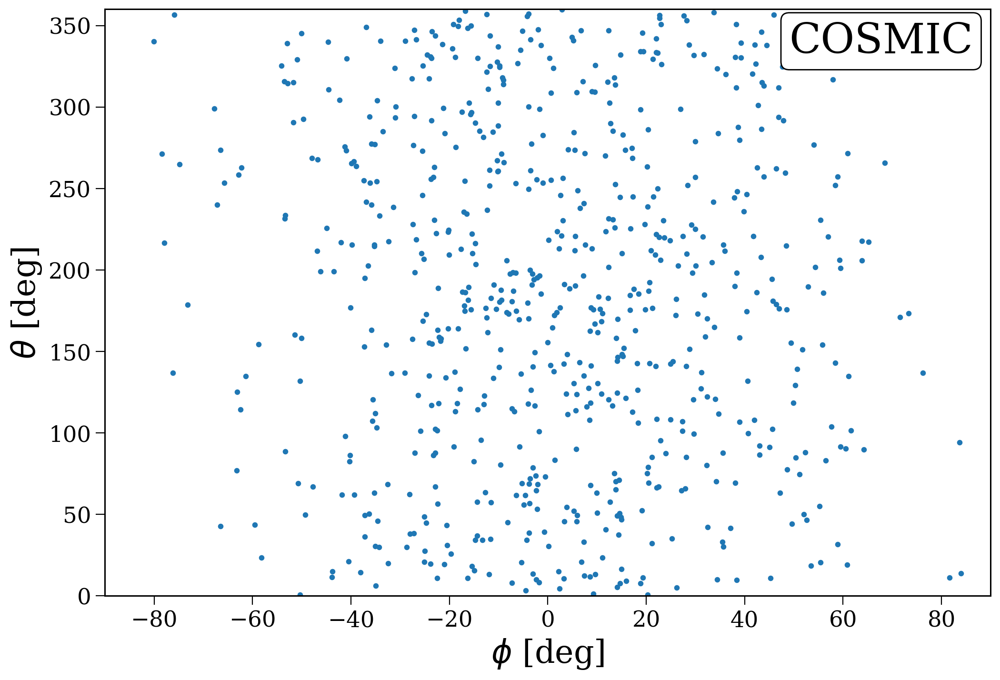

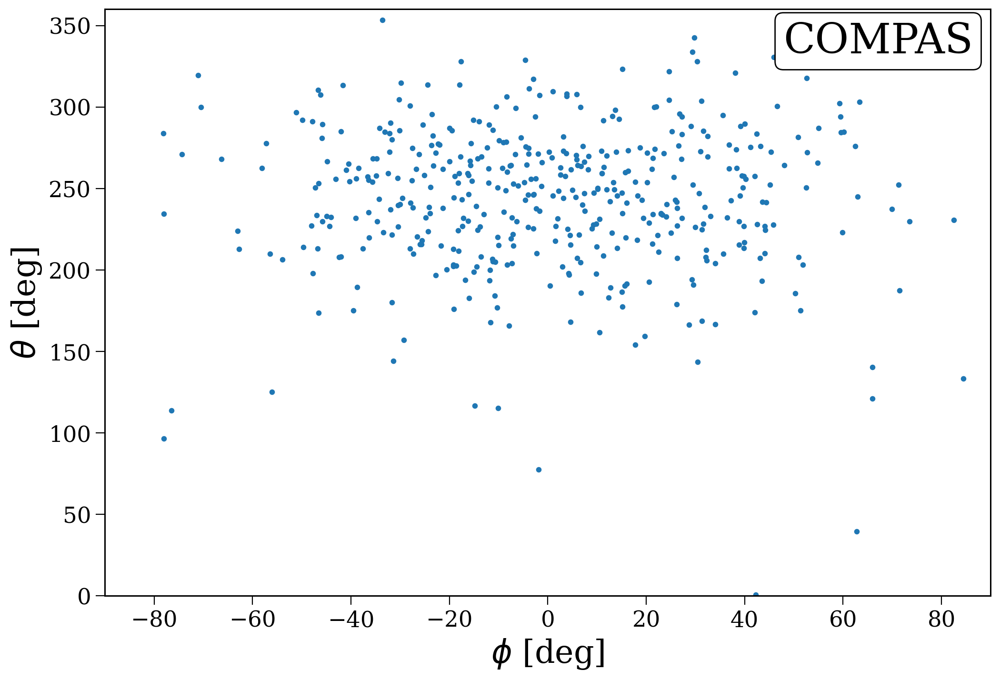

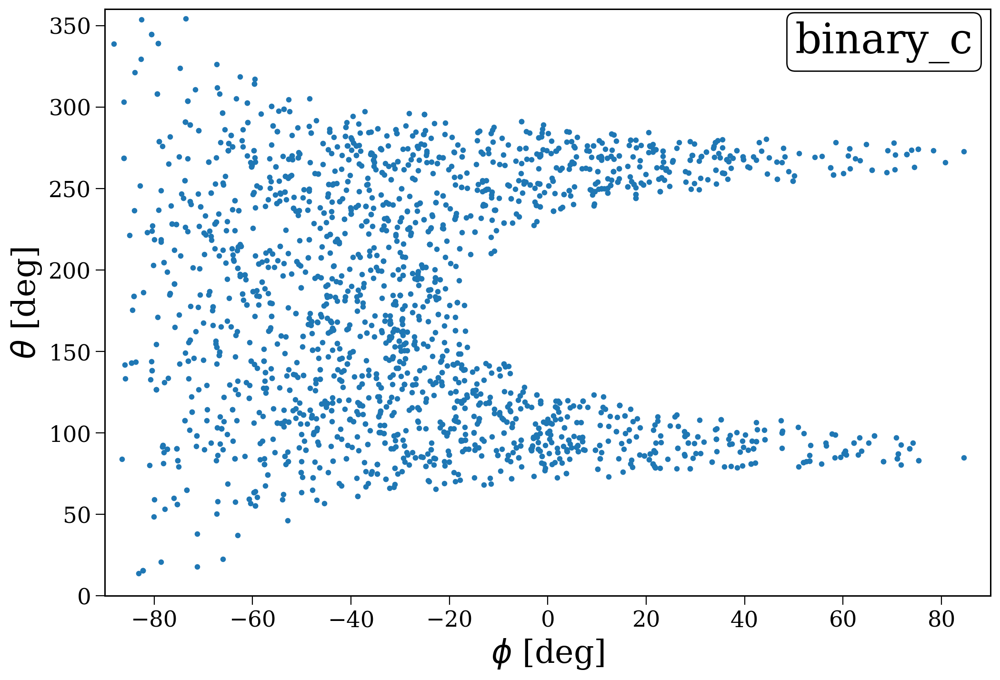

In [12]:
for d in data:
    mask = (d["kicks"]["disrupted"] == 0)
    scatter = plt.scatter(d["kicks"]["phi"][mask], d["kicks"]["theta"][mask], s=10)
    plt.xlabel(r"$\phi$ [deg]")
    plt.ylabel(r"$\theta$ [deg]")
    plt.xlim(-90, 90)
    plt.ylim(0, 360)
    plt.annotate(d["l"], (0.98, 0.98), xycoords="axes fraction", color="black",
                 fontsize=1.3*fs, fontweight="normal", ha="right", va="top",
                 bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.2"))
    plt.show()

# Angle dependence

In [51]:
def plot_ejection_kick_with_angle(d):

    fig, ax = plt.subplots()

    natal_kicks = d["kicks"]
    scatter = plt.scatter(natal_kicks["vsys_2_total"][natal_kicks["disrupted"] == 1] - d["v_orb_2"],
                      natal_kicks["natal_kick"][natal_kicks["disrupted"] == 1],
                      c=natal_kicks["theta"][natal_kicks["disrupted"] == 1] / 360 * 2 * np.pi,
                      s=1, cmap="twilight")
    cbar = plt.colorbar(scatter)
    cbar.set_label(r"Azimuthal angle of kick, $\omega \, [\rm rad]$")
    cbar.ax.set_yticks([0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi])
    cbar.ax.set_yticklabels(["0", r"$\pi/2$", r"$\pi$", r"$3\pi/2$", r"$2\pi$"])

    ax.set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
           ylabel="Natal kick velocity (km/s)",
           xlim=(-4, 4),
           ylim=(0, 1100))
    
    ax.annotate(d["l"], (0.05, 0.95), xycoords="axes fraction", color="black",
                fontsize=1.3*fs, fontweight="normal", ha="left", va="top")

    plt.show()

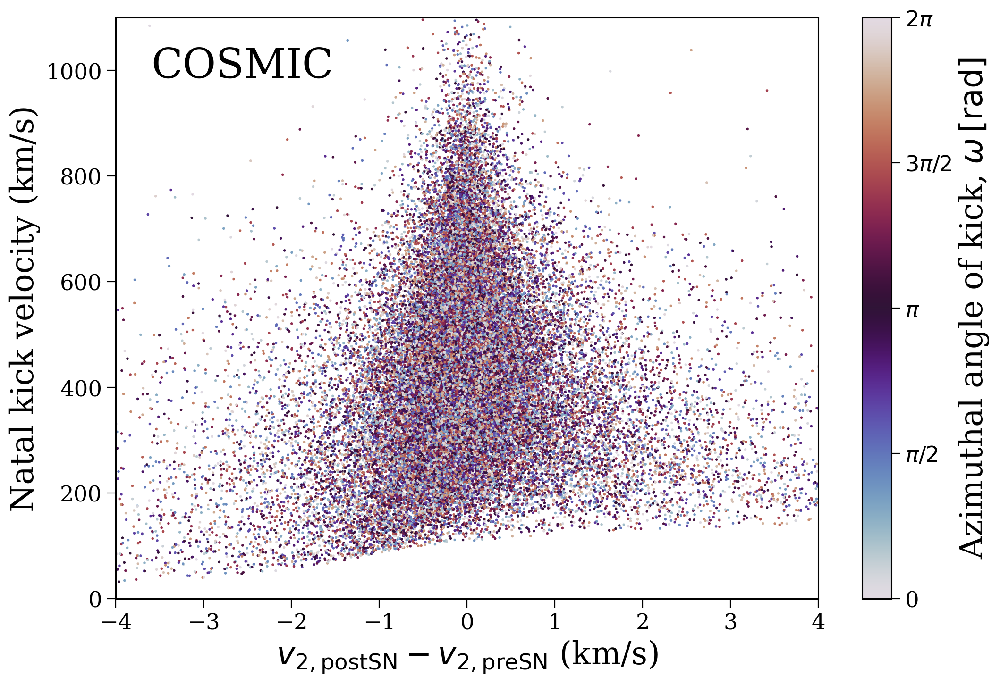

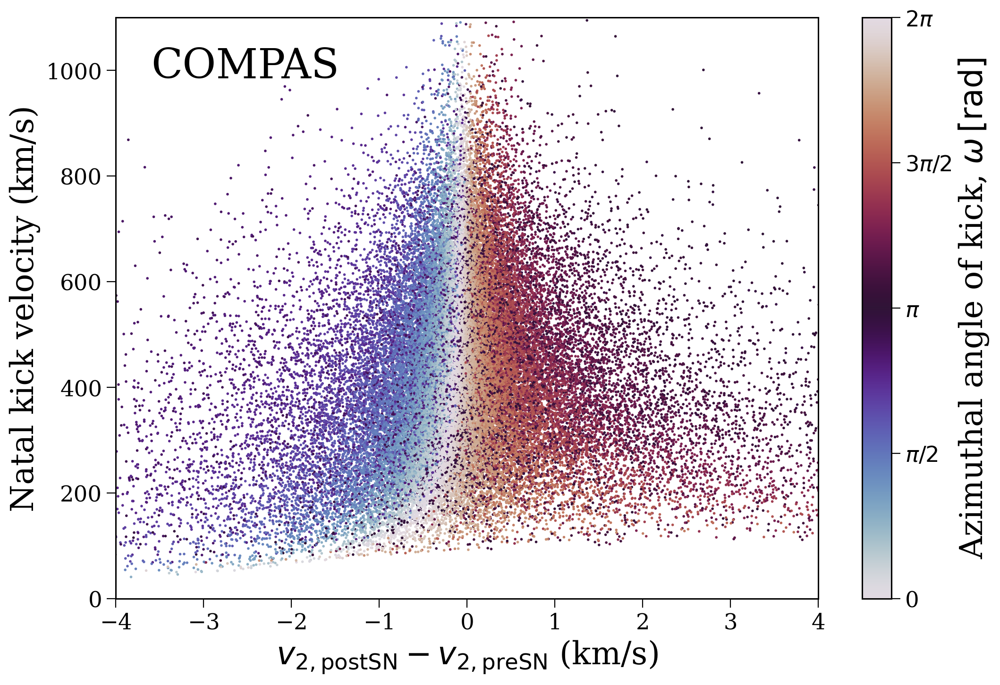

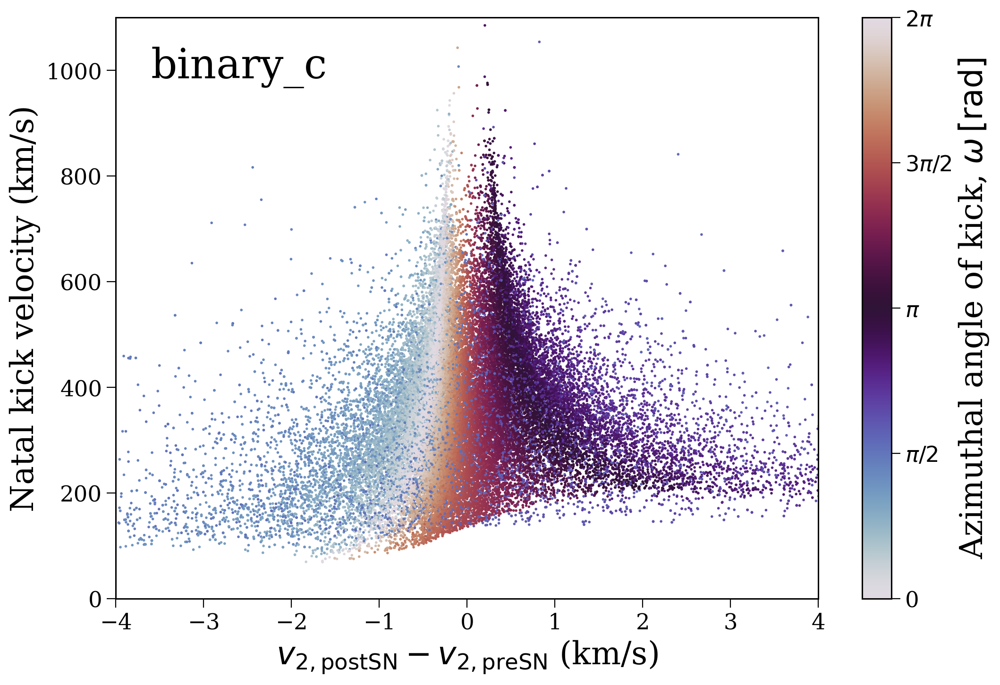

In [52]:
for d in data:
    plot_ejection_kick_with_angle(d)

# Strange `binary_c` binaries

In [89]:
weirdos = bc_kicks[((bc_kicks["vsys_2_total"] == 0) & (bc_kicks["disrupted"] == 1))]

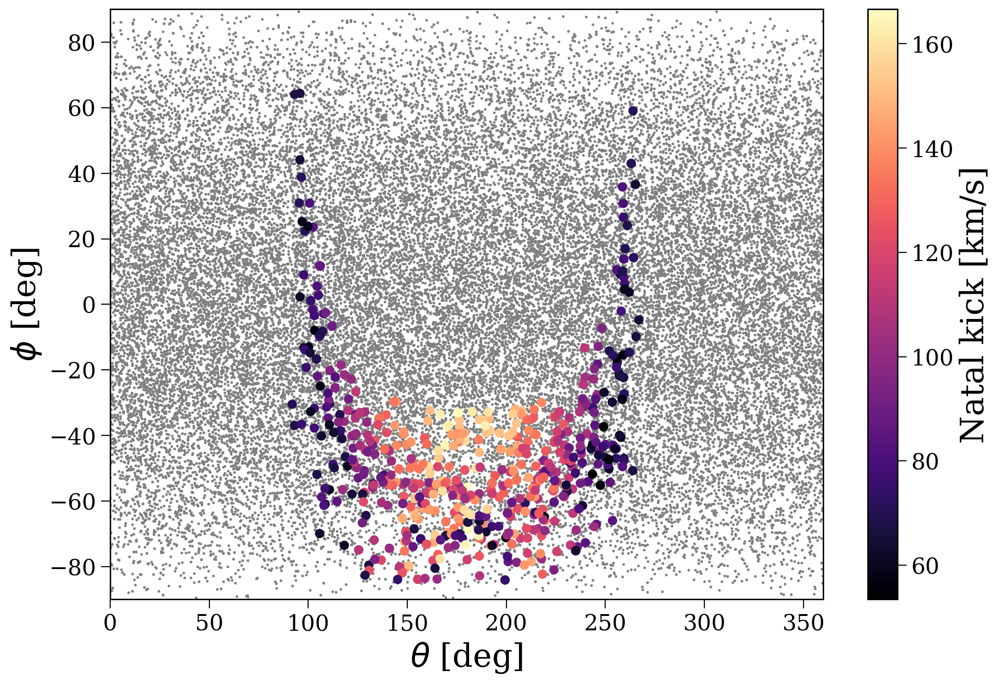

In [111]:
plt.scatter(bc_kicks["theta"], bc_kicks["phi"], c='grey', s=1)
scatter = plt.scatter(weirdos["theta"], weirdos["phi"], c=weirdos["natal_kick"], cmap="magma")
plt.colorbar(scatter, label="Natal kick [km/s]")
plt.xlim(0, 360)
plt.ylim(-90, 90)
plt.xlabel(r"$\theta$ [deg]")
plt.ylabel(r"$\phi$ [deg]")
plt.show()